# 인물모드 문제점 찾기

- M1 맥북에서는 pixellib 패키지를 설치할 수 없어서 window notebook에 가상환경 설정하여 작업하였다.

## 참고 - Semantic Segmentation에 대하여

- 컴퓨터비젼 분야에서 가장 핵심적인 분양중에 하나이다.
- 단순히 사진을 분류하는데 그치지 않고 그 장면을 완벽하게 이해해야하는 높은 수준의 문제이다.
- 자율주행에서부터 Kaggle에서 있었던 `해상에서 선박 찾기`까지 적용분야가 무궁무진하다.
- Deep Convolution Neural Network을 적용해서 많은 발전을 이루었다.
>
>구글 AI블로그에 의하면 Semantic Segmentation 모델인 DeepLab V3+를 사용해서 구글폰인 Pixel 2와 Pixel 2X의 
 Potrtait Mode를 구현했다고 한다. 아이폰의 Portrait Mode와 비슷한 기능으로, 아이폰 X은 2개의 카메라를 사용하여 
 같은 효과를 만들었는데 구글은 상대적으로 저렴하게 같은 기능을 구현했다고 할 수 있지 않을까요?
 
- [참고 링크](https://medium.com/hyunjulie/1%ED%8E%B8-semantic-segmentation-%EC%B2%AB%EA%B1%B8%EC%9D%8C-4180367ec9cb)

## Step 1. 인물모드 무작정 해보기

### 1. 사진을 준비하자

- 사용할 model과 image 파일들 디렉토리 구조

```
- aiffel/human_segmentation
    ├── models
            └── deeplabv3_xception_tf_dim_ordering_tf_kernels.h5
            └── xception_pascalvoc.pb
            
    ├── images
            └── my_image.png (사진은 각자 파일명에 따라 사용)
```


In [2]:
# package load
import os      #파일 관리 위해 필요
import urllib  #웹에서 데이터 다운로드시 사용
import cv2     #OpenCV 라이브러리 이미지 처리위해 필요
import numpy as np
from pixellib.semantic import semantic_segmentation  #시맨틱 세그멘테이션 사용위해 필요
from matplotlib import pyplot as plt

print('O.K 👌')

O.K 👌


- 사진 배경에 다수의 사람들이 있는 사진을 사용해 보았다.

(768, 1024, 3)


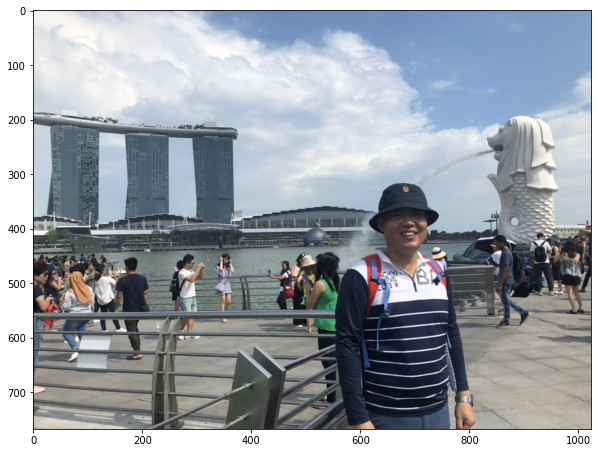

In [3]:
# 사용하는 이미지의 경로에 맞게 지정
img_path = 'C:/Users/dongu/aiffel/human_segmentation/images/psd_group.png'  
img_orig = cv2.imread(img_path) 

plt.figure(figsize=(10, 10))
print(img_orig.shape)
plt.imshow(cv2.cvtColor(img_orig, cv2.COLOR_BGR2RGB))
plt.show()

### 2. Segmentation Model을 준비하자

- PixelLib에서 제공하는 모델을 다운로드하고 저장하자

In [4]:
# 사용할 model 경로 및 파일 이름 결정
model_dir = 'C:/Users/dongu/aiffel/human_segmentation/models'
model_file = os.path.join(model_dir, 'deeplabv3_xception_tf_dim_ordering_tf_kernels.h5')

# 모델은 다운로드하여 저장해 놓았기에 주석처리

# PixelLib가 제공하는 모델의 url입니다
# model_url = 'https://github.com/ayoolaolafenwa/PixelLib/releases/download/1.1/deeplabv3_xception_tf_dim_ordering_tf_kernels.h5'

# 다운로드를 시작합니다
# urllib.request.urlretrieve(model_url, model_file)

### 3. Segmentation Model을 이용하여 인물사진 효과를 만들어보자

In [5]:
#다운로드한 모델 이용 - 사용할 세그멘테이션 모델 생성
model = semantic_segmentation()
model.load_pascalvoc_model(model_file)

In [6]:
#모델에 이미지 입력(PASCAL VOC 데이터로 학습된 모델 이용)
segvalues, output = model.segmentAsPascalvoc(img_path)

- [PASCAL VOC(Visual Object Classes)](http://host.robots.ox.ac.uk/pascal/VOC/)


In [7]:
# PASCAL VOC 데이터의 라벨 종류
LABEL_NAMES = [
    'background', 'aeroplane', 'bicycle', 'bird', 'boat', 'bottle', 'bus',
    'car', 'cat', 'chair', 'cow', 'diningtable', 'dog', 'horse', 'motorbike',
    'person', 'pottedplant', 'sheep', 'sofa', 'train', 'tv'
]
len(LABEL_NAMES)

21

- `output`으로 결과 확인

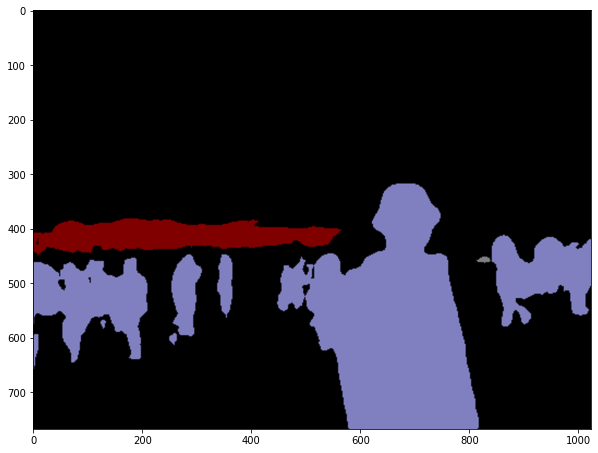

In [8]:
plt.figure(figsize=(10, 10))
plt.imshow(output)

- `output`에는 세그멘테이션이 된 결과가 각각 다른 색상으로 담겨 있다.

In [9]:
segvalues

{'class_ids': array([ 0,  4,  7, 15], dtype=int64),
 'masks': array([[False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False],
        ...,
        [False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False]])}

- `segvalues`에는 `class_ids`와 `masks`가 있다. 
- 아래 `class_ids`를 확인해 어떤 물체가 있는지 확인해 보자.


In [10]:
for class_id in segvalues['class_ids']:
    print(LABEL_NAMES[class_id])

background
boat
car
person


- 위 LABEL_NAMES에서 보았던 물체들이 확인 되었다.
- 물체마다 `output`에 어떤 색상으로 나타나 있는지 알아보자.

In [11]:
# PixelLib에서 그대로 가져온 코드 - 주목해야 할 것은 생성 코드 결과물!
colormap = np.zeros((256, 3), dtype = int)
ind = np.arange(256, dtype=int)

for shift in reversed(range(8)):
    for channel in range(3):
        colormap[:, channel] |= ((ind >> channel) & 1) << shift
    ind >>= 3

colormap[:20]

array([[  0,   0,   0],
       [128,   0,   0],
       [  0, 128,   0],
       [128, 128,   0],
       [  0,   0, 128],
       [128,   0, 128],
       [  0, 128, 128],
       [128, 128, 128],
       [ 64,   0,   0],
       [192,   0,   0],
       [ 64, 128,   0],
       [192, 128,   0],
       [ 64,   0, 128],
       [192,   0, 128],
       [ 64, 128, 128],
       [192, 128, 128],
       [  0,  64,   0],
       [128,  64,   0],
       [  0, 192,   0],
       [128, 192,   0]])

- `PixelLib`에 지정된 색은 위와 같다. 사람을 나타내는 15번째 색상은 무엇인지 확인해 보자

In [12]:
colormap[15]
# colormap[8]

array([192, 128, 128])

### 주의
- `output` 이미지가 **BGR** 순서로 채널 배치가 되어있다.
- `colormap`은 **RGB**순이기에 추출해야 하는 색상 값을 아래처럼 **BGR**순으로 바꿔줘야 한다.

In [13]:
seg_color = (128, 128, 192)
# seg_color1 = (128, 0, 128)

(768, 1024)


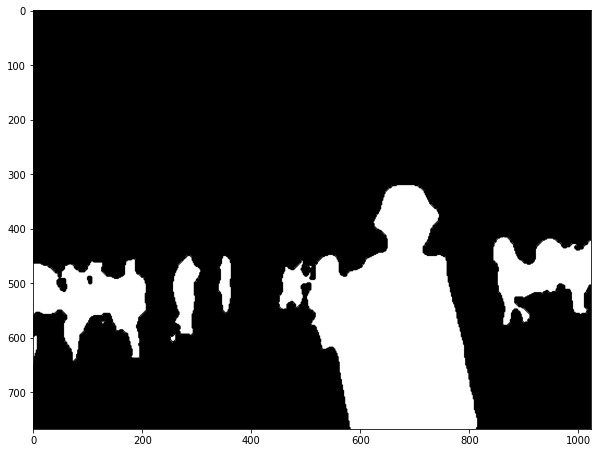

In [14]:
# output의 픽셀 별로 색상이 seg_color와 같다면 1(True), 다르다면 0(False)이 됩니다
seg_map = np.all(output==seg_color, axis=-1)
print(seg_map.shape)
plt.figure(figsize=(10, 10))
plt.imshow(seg_map, cmap='gray')
plt.show()

- 세그멘테이션이 얼마나 잘 되었는지 원래 이미지와 겹쳐서 확인해 보자.

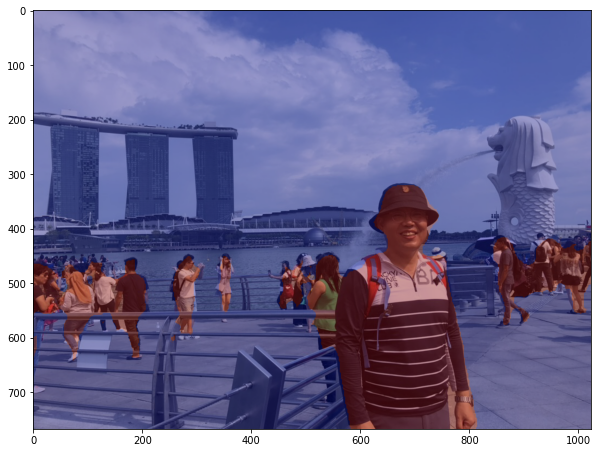

In [15]:
img_show = img_orig.copy()

# True과 False인 값을 각각 255과 0으로 바꿔줍니다
img_mask = seg_map.astype(np.uint8) * 255

# 255와 0을 적당한 색상으로 바꿔봅니다
color_mask = cv2.applyColorMap(img_mask, cv2.COLORMAP_JET)

# 원본 이미지와 마스트를 적당히 합쳐봅니다
# 0.6과 0.4는 두 이미지를 섞는 비율입니다.
img_show = cv2.addWeighted(img_show, 0.6, color_mask, 0.4, 0.0)

plt.figure(figsize=(10, 10))
plt.imshow(cv2.cvtColor(img_show, cv2.COLOR_BGR2RGB))
plt.show()

- 확인해 보니 세그멘테이션이 잘 된것을 알 수 있다.
- 이제 아래에서 `blur()`를 사용하여 배경을 흐리게 만들어 보자.

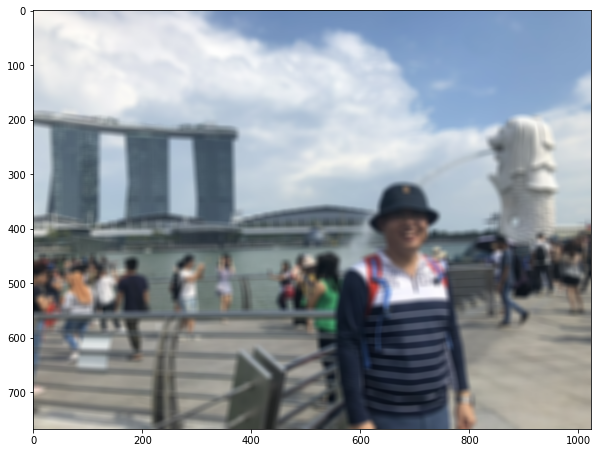

In [16]:
# (12,12)은 blurring kernel size를 뜻한다.
img_orig_blur = cv2.blur(img_orig, (12,12))  
plt.figure(figsize=(10, 10))
plt.imshow(cv2.cvtColor(img_orig_blur, cv2.COLOR_BGR2RGB))
plt.show()

- 이제 흐려진 이미지에서 세그멘테이션 마스크를 이용하여 아래와 같이 배경만 추출해 보자.

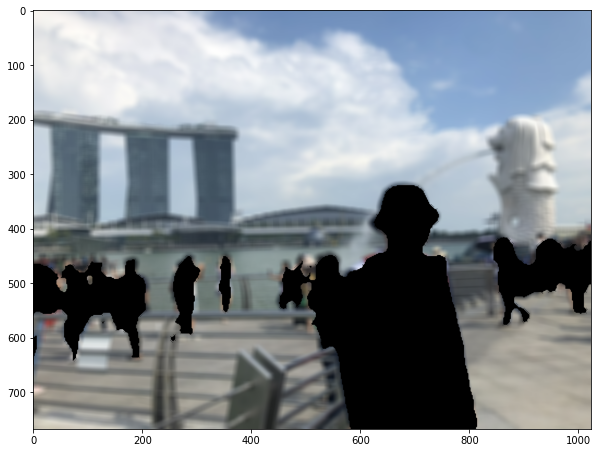

In [17]:
img_mask_color = cv2.cvtColor(img_mask, cv2.COLOR_GRAY2BGR)
img_bg_mask = cv2.bitwise_not(img_mask_color)
img_bg_blur = cv2.bitwise_and(img_orig_blur, img_bg_mask)
plt.figure(figsize=(10, 10))
plt.imshow(cv2.cvtColor(img_bg_blur, cv2.COLOR_BGR2RGB))
plt.show()

- `bitwise_not` 함수를 이용하면 이미지가 반전된다.
- 원래 마스크 = 배경 : 0, 사람 : 255
- `bitwise_not` 연산 후 = 배경 : 255, 사람 : 0
- 반전된 세그멘테이션 결과 이용 : 이미지와 `bitwise_and` 연산 수행 = 배경만 있는 영상 획득
    - 0과 어떤 수를 bitwise_and 연산을 해도 0이 되기 때문에
    - 사람이 0인 경우 사람이 있던 모든 픽셀이 0이 된다.
    - 결국 사람이 사라지게 되는 된다.

- 이제 배경과 사람 이미지를 합쳐서 확인해 보자.

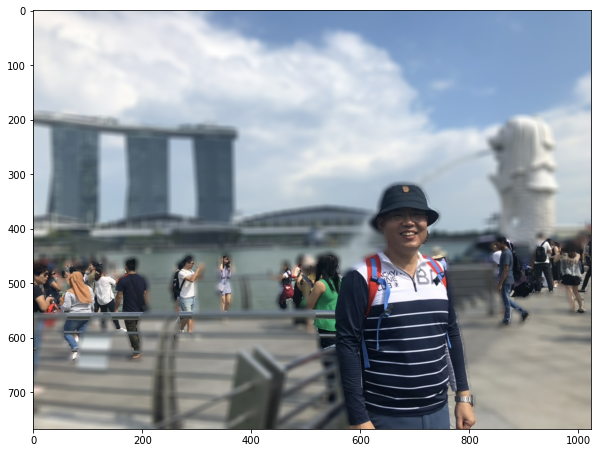

In [18]:
img_concat = np.where(img_mask_color==255, img_orig, img_bg_blur)
plt.figure(figsize=(10, 10))
plt.imshow(cv2.cvtColor(img_concat, cv2.COLOR_BGR2RGB))
plt.show()

- 배경이 `blur` 처리가 되면서 심도가 낮은 인물모두 사진과 비슷하게 구현 되었다.
- 하지만 제대로 처리되지 않은 부분이 보인다. 아래와 같다.

    1.인물의 어깨 라인 부분과 머리에 쓰고 있는 모자 부분도 `blur`처리가 된 것으로 보인다.  
    2.배경에 있어야 할 사람들도 `person` 으로 인식해서 같은 색상 값을 가지므로 `blur` 처리가 되지 않았다.  
    3.사진에는 없는 `class`를 인식한 것 같았다.


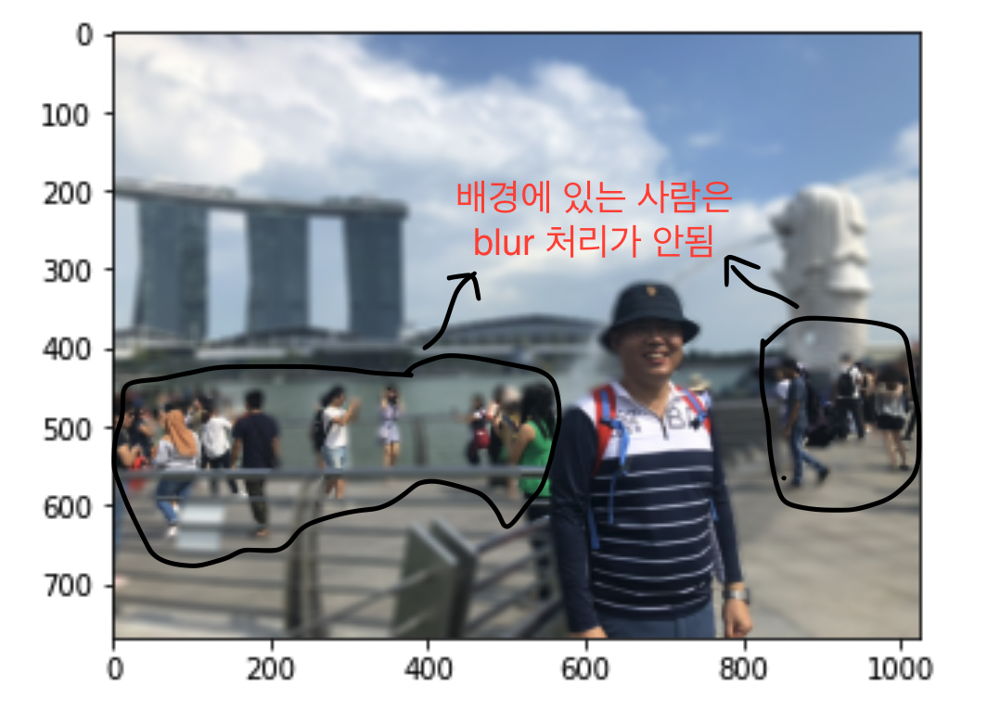


- 이유는 아래와 같이 파악되었다.
    - Semantic Image Segmentation은 같은 class의 instance를 구별하지 않기때문에 나타난 현상으로 판단된다.  
    - 아래 그림 참조
    
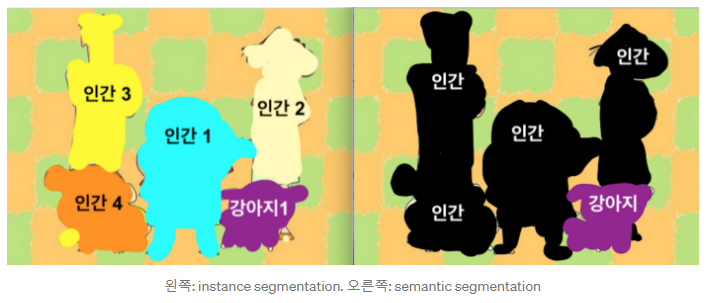


- 또한 class_ids에서 사진에는 없는 4:`boat`, 7:`car` 가 확인되는 것은 모델이 제대로 인식하지 못한 것 같다.
- 아래에서 확인해 보면


In [19]:
# 4:boat
colormap[4]

array([  0,   0, 128])

In [20]:
seg_color = (128, 0, 0)

(768, 1024)


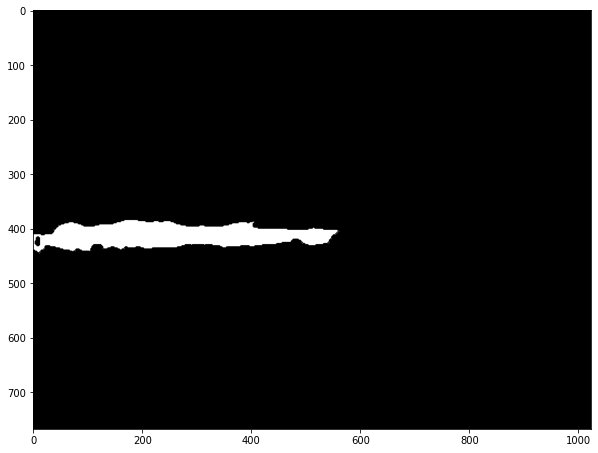

In [21]:
seg_map = np.all(output==seg_color, axis=-1)
print(seg_map.shape)
plt.figure(figsize=(10, 10))
plt.imshow(seg_map, cmap='gray')
plt.show()

- 위 처럼 `boat`로 잘못 인식

In [22]:
# 7:car
colormap[7]

array([128, 128, 128])

In [23]:
seg_color = (128, 128, 128)

(768, 1024)


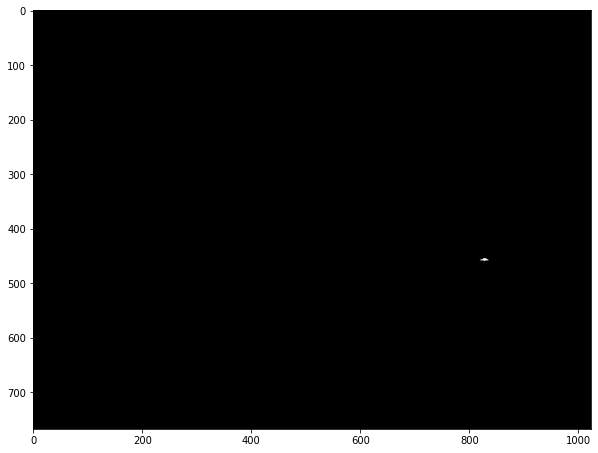

In [24]:
seg_map = np.all(output==seg_color, axis=-1)
print(seg_map.shape)
plt.figure(figsize=(10, 10))
plt.imshow(seg_map, cmap='gray')
plt.show()

- 위 처럼 `car`로 잘못 인식된 것으로 확인되고 오류로 판단된다. 
- 이 부분의 해결을 위해 좀 더 다양한 방법을 시도해 보고 해결책을 찾아보자.

## Step 2. 고양이 사진도 한번 해보자

### 1. 위 인물사진의 코드 진행 흐름대로 흘러가보자
- 고양이 이미지는 `png`가 아닌 `jpeg` 파일로 시도해보자
- Segmentation Model은 다운로드 되어 있는 모델 그대로 사용

(413, 800, 3)


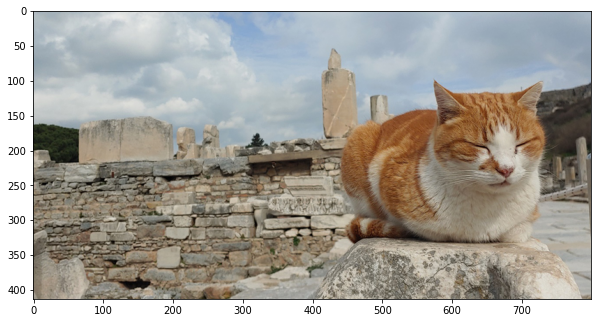

In [25]:
# 고양이 이미지 경로 지정
img_path = 'C:/Users/dongu/aiffel/human_segmentation/images/cat12.jpeg'  
img_orig = cv2.imread(img_path) 

print(img_orig.shape)
plt.figure(figsize=(10, 10))
plt.imshow(cv2.cvtColor(img_orig, cv2.COLOR_BGR2RGB))
plt.show()

In [26]:
model = semantic_segmentation()
model.load_pascalvoc_model(model_file)

In [27]:
segvalues, output = model.segmentAsPascalvoc(img_path)

In [28]:
# LABEL_NAMES = [
#     'background', 'aeroplane', 'bicycle', 'bird', 'boat', 'bottle', 'bus',
#     'car', 'cat', 'chair', 'cow', 'diningtable', 'dog', 'horse', 'motorbike',
#     'person', 'pottedplant', 'sheep', 'sofa', 'train', 'tv'
# ]
# len(LABEL_NAMES)

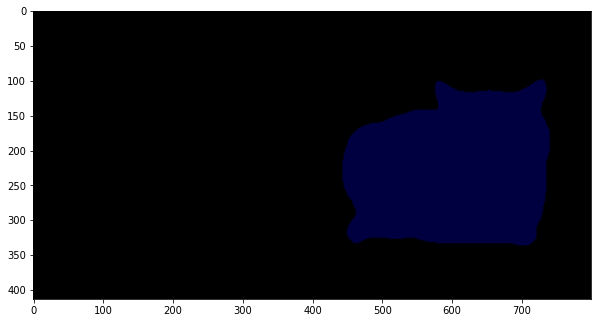

In [29]:
plt.figure(figsize=(10, 10))
plt.imshow(output)

In [30]:
segvalues

{'class_ids': array([0, 8], dtype=int64),
 'masks': array([[False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False],
        ...,
        [False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False]])}

In [31]:
for class_id in segvalues['class_ids']:
    print(LABEL_NAMES[class_id])

background
cat


In [32]:
# PixelLib에서 그대로 가져온 코드 - 주목해야 할 것은 생성 코드 결과물!
colormap = np.zeros((256, 3), dtype = int)
ind = np.arange(256, dtype=int)

for shift in reversed(range(8)):
    for channel in range(3):
        colormap[:, channel] |= ((ind >> channel) & 1) << shift
    ind >>= 3

colormap[:20]

array([[  0,   0,   0],
       [128,   0,   0],
       [  0, 128,   0],
       [128, 128,   0],
       [  0,   0, 128],
       [128,   0, 128],
       [  0, 128, 128],
       [128, 128, 128],
       [ 64,   0,   0],
       [192,   0,   0],
       [ 64, 128,   0],
       [192, 128,   0],
       [ 64,   0, 128],
       [192,   0, 128],
       [ 64, 128, 128],
       [192, 128, 128],
       [  0,  64,   0],
       [128,  64,   0],
       [  0, 192,   0],
       [128, 192,   0]])

- `PixelLib`에 지정된 색은 위와 같다. 고양이를 나타내는 8번째 색상은 무엇인지 확인해 보자

In [33]:
colormap[8]

array([64,  0,  0])

In [34]:
seg_color = (0, 0, 64)

(413, 800)


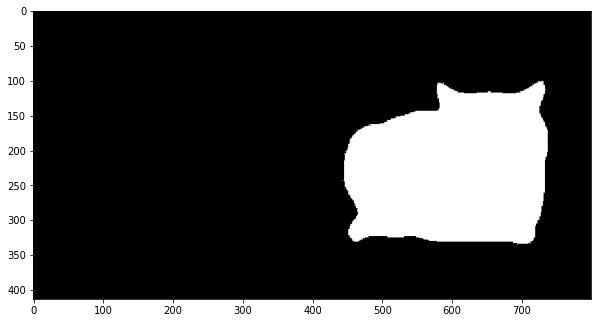

In [35]:
# output의 픽셀 별로 색상이 seg_color와 같다면 1(True), 다르다면 0(False)이 됩니다
seg_map = np.all(output==seg_color, axis=-1)
print(seg_map.shape)
plt.figure(figsize=(10, 10))
plt.imshow(seg_map, cmap='gray')
plt.show()

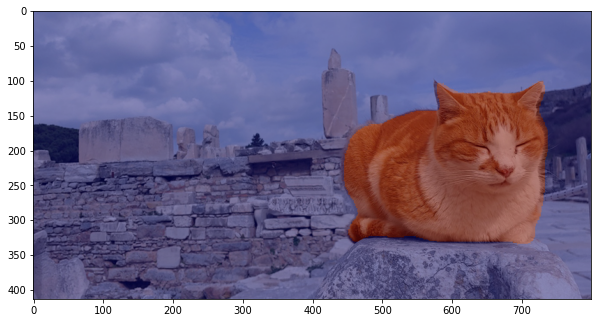

In [36]:
img_show = img_orig.copy()

# True과 False인 값을 각각 255과 0으로 바꿔줍니다
img_mask = seg_map.astype(np.uint8) * 255

# 255와 0을 적당한 색상으로 바꿔봅니다
color_mask = cv2.applyColorMap(img_mask, cv2.COLORMAP_JET)

# 원본 이미지와 마스트를 적당히 합쳐봅니다
# 0.6과 0.4는 두 이미지를 섞는 비율입니다.
img_show = cv2.addWeighted(img_show, 0.6, color_mask, 0.4, 0.0)

plt.figure(figsize=(10, 10))
plt.imshow(cv2.cvtColor(img_show, cv2.COLOR_BGR2RGB))
plt.show()

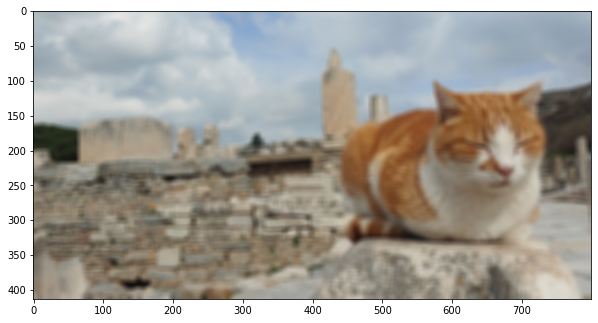

In [37]:
# (9,9)은 blurring kernel size를 뜻한다.
img_orig_blur = cv2.blur(img_orig, (9,9))  
plt.figure(figsize=(10, 10))
plt.imshow(cv2.cvtColor(img_orig_blur, cv2.COLOR_BGR2RGB))
plt.show()

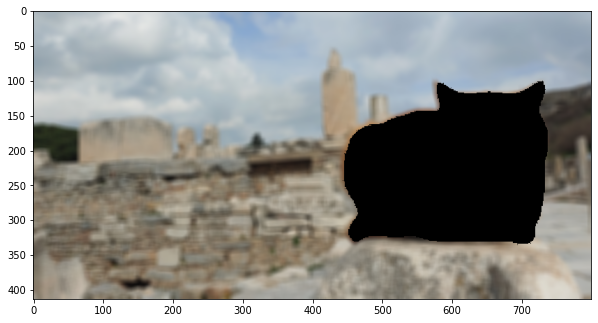

In [38]:
img_mask_color = cv2.cvtColor(img_mask, cv2.COLOR_GRAY2BGR)
img_bg_mask = cv2.bitwise_not(img_mask_color)
img_bg_blur = cv2.bitwise_and(img_orig_blur, img_bg_mask)
plt.figure(figsize=(10, 10))
plt.imshow(cv2.cvtColor(img_bg_blur, cv2.COLOR_BGR2RGB))
plt.show()

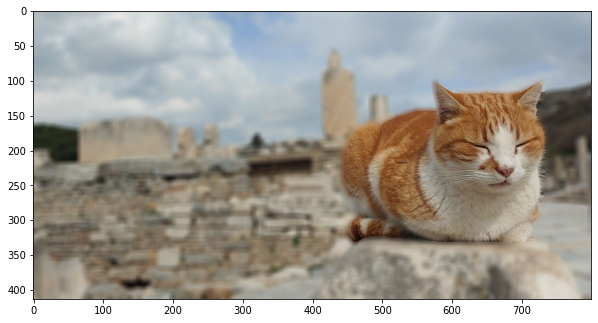

In [39]:
img_concat = np.where(img_mask_color==255, img_orig, img_bg_blur)
plt.figure(figsize=(10, 10))
plt.imshow(cv2.cvtColor(img_concat, cv2.COLOR_BGR2RGB))
plt.show()

- 배경이 blur 처리가 되면서 고양이도 인물모드 사진이 적용되는 것을 확인하였다.
- 이번에는 배경과 고양이만 존재해서 그런지 꽤 자연스럽게 구현이 된 것으로 판단된다.
- 루브릭 기준에 고양이 사진도 도전해 보라고 한 이유는 
- **20가지의 class에 대한 컬러가 다르기에 각 class에 맞는 색상 값으로 변경이 필요하기에 요구한 것**으로 판단했다.
- 덕분에 이 부분에 대한 습득은 확실하게 한 것으로 생각된다.

## Step 3. PixelLib 에서 제공하는 Image Tunning 활용해보자

## Image Tunning

    - 영상 분할을 통한 영상의 배경 변화
    - 이미지 분할 : 분할 된 개체를 제거하고 생성 된 새 배경에 배치하는 것
    - 분할을 통해 이미지에 대한 마스크를 생성하고 수정 된 배경과 결합하여 수행

### 1. 이미지 배경에 고유한 색상 지정

- 사용할 원본 이미지 확인

(1024, 768, 3)


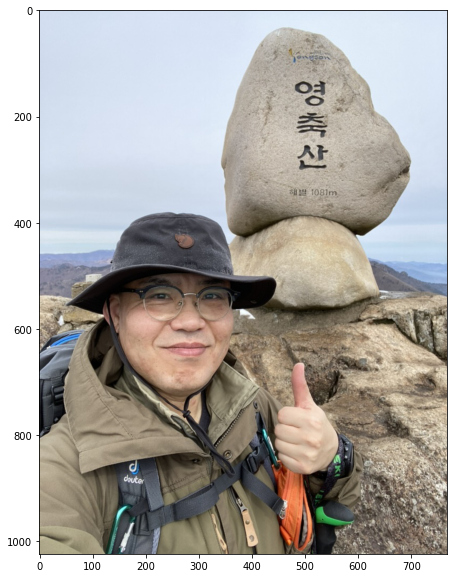

In [40]:
# 사용하는 이미지의 경로에 맞게 지정
# img_path = os.getenv('HOME')+'/aiffel/human_segmentation/images/kimyuna.png'
# img_path = os.getenv('HOME')+'/aiffel/human_segmentation/images/psd_group.png'
img_path = 'C:/Users/dongu/aiffel/human_segmentation/images/psd24.png'  

img_orig = cv2.imread(img_path) 

print(img_orig.shape)
plt.figure(figsize=(10, 10))
plt.imshow(cv2.cvtColor(img_orig, cv2.COLOR_BGR2RGB))
plt.show()


- 원본 이미지에 새로운 배경색상 적용


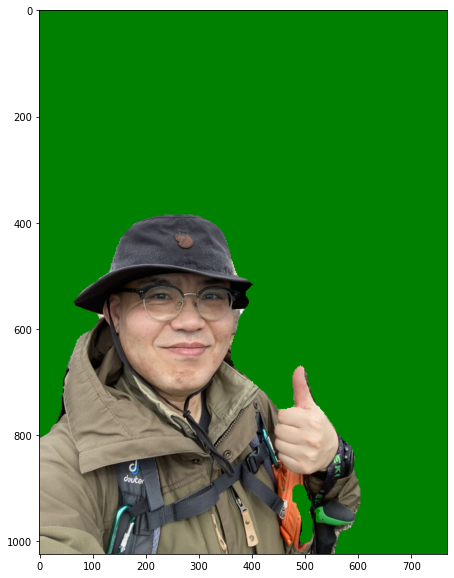

In [41]:
import pixellib
from pixellib.tune_bg import alter_bg

cb_img_path = 'C:/Users/dongu/aiffel/human_segmentation/images/'

change_bg = alter_bg()
change_bg.load_pascalvoc_model(model_file)
cb_img_output = change_bg.color_bg(img_path, 
                                   colors = (0,128,0),  #배경 색상 green 적용
                                   output_image_name=cb_img_path+"colored_bg.png",
                                   detect = 'person')
plt.figure(figsize=(10, 10))
plt.imshow(cv2.cvtColor(cb_img_output, cv2.COLOR_BGR2RGB))
plt.show()



- 위와 같이 배경에 green 색상이 적용된 것을 확인할 수 있다.
- 하지만 위 이미지도 완벽하게 구현된 것은 아니다.
- 원본과 비교해 보면 왼손 엄지 방향의 모자 부분이 일부 소실된 것을 볼 수 있다.

In [42]:
segvalues, output = model.segmentAsPascalvoc(img_path)
segvalues

{'class_ids': array([ 0,  7, 15], dtype=int64),
 'masks': array([[False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False],
        ...,
        [ True,  True,  True, ..., False, False, False],
        [ True,  True,  True, ..., False, False, False],
        [ True,  True,  True, ..., False, False, False]])}

In [43]:
colormap[7]

array([128, 128, 128])

(1024, 768)


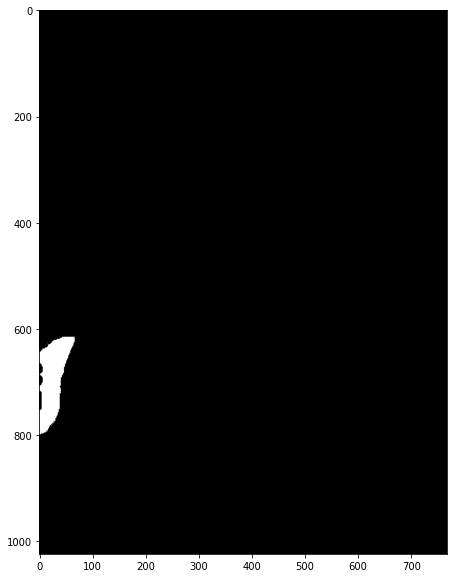

In [44]:
seg_color = (128, 128, 128)
# output의 픽셀 별로 색상이 seg_color와 같다면 1(True), 다르다면 0(False)이 됩니다
seg_map = np.all(output==seg_color, axis=-1)
print(seg_map.shape)
plt.figure(figsize=(10, 10))
plt.imshow(seg_map, cmap='gray')
plt.show()

- 또한 위와 같이 `calss_ids`를 확인배 보니 엉뚱한 7:`car`를 인식한 것을 확인할 수 있다.
- 그런데 최종 green으로 적용된 사진에서는 7:`car`의 모습은 적용되지 않은 것을 확인할 수 있다.
- 왜 그럴까? 하고 무수히 많은 고민과 검색을 해 보았지만 시원한 대답을 확인할 수는 없었다.
- 개인적은 사견으로는 학습된 모델의 정확도가 부족한 것이 아닌가!! 하고 생각해 보았다.
- 그럼 이것을 해결하기 위한 방법은 없는 것일까??!!! 계속 고민해 보았다.
___

### 2. 이미지 배경에 BLUR  처리


- 이번엔 pascalvoc 데이터셋에서 훈련된 Deeplabv3+ 모델을 사용해 `blur` 를 시도해 보았다.
- 다양한 방법중에 간단히 5줄 정도 코딩으로 배경을 `blur` 처리하는 방법이다.
- [참고 링크](https://github.com/ayoolaolafenwa/PixelLib/blob/master/Tutorials/change_image_bg.md)

original image shape : (1024, 768, 3)
1. original image


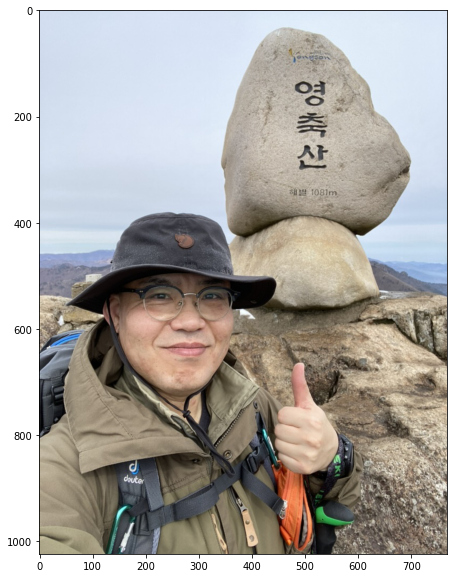

2. low blur background image


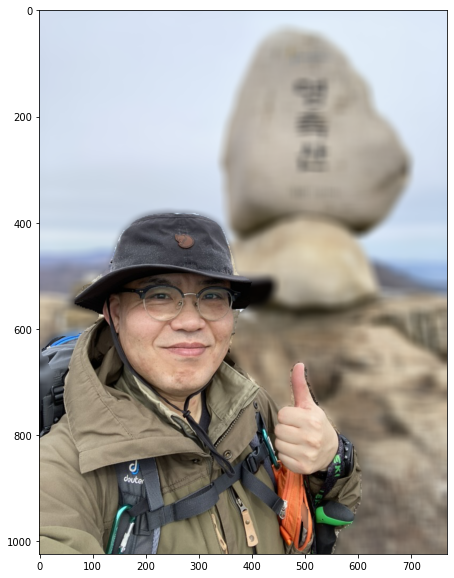

In [45]:
model_dir = 'C:/Users/dongu/aiffel/human_segmentation/models/'
pb_model_file = os.path.join(model_dir, 'xception_pascalvoc.pb')

f_img_path = 'C:/Users/dongu/aiffel/human_segmentation/images/psd24.png'  
n_img_path = 'C:/Users/dongu/aiffel/human_segmentation/images/'

f_img_orig = cv2.imread(f_img_path) 


print("original image shape :", f_img_orig.shape)
print("1. original image")
plt.figure(figsize=(10, 10))
plt.imshow(cv2.cvtColor(f_img_orig, cv2.COLOR_BGR2RGB))
plt.show()

change_bg = alter_bg(model_type = "pb")
change_bg.load_pascalvoc_model(pb_model_file)
bl_img_output = change_bg.blur_bg(f_img_path, 
                                  low = True,  # blur의 강도 - moderate(중), extreme(상)
                                  output_image_name=n_img_path+"blur_img_psd24.png")

# 본인이 선택한 이미지의 경로에 맞게 바꿔 주세요.
print("2. low blur background image")
plt.figure(figsize=(10, 10))
plt.imshow(cv2.cvtColor(bl_img_output, cv2.COLOR_BGR2RGB))
plt.show()

- 먼저 해 보았던 고양이 사진도 다른 사진으로 한번에 변경해 보자.

original image shape : (800, 600, 3)
1. original image


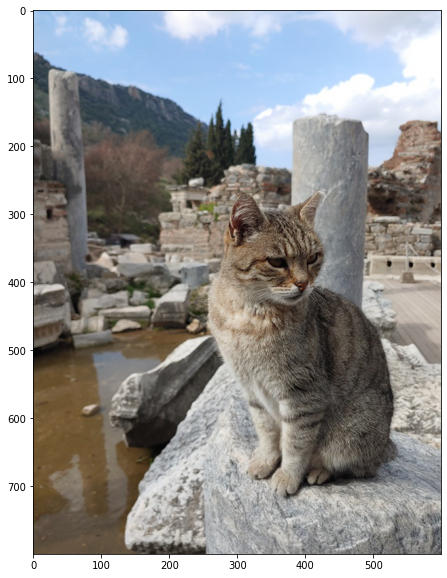

2. low blur background image


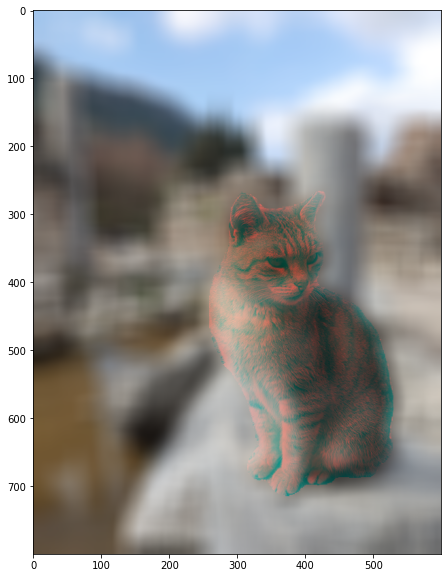

In [46]:
model_dir = 'C:/Users/dongu/aiffel/human_segmentation/models/'
pb_model_file = os.path.join(model_dir, 'xception_pascalvoc.pb')

f_img_path = 'C:/Users/dongu/aiffel/human_segmentation/images/cat11.png'  
n_img_path = 'C:/Users/dongu/aiffel/human_segmentation/images/'

f_img_orig = cv2.imread(f_img_path) 


print("original image shape :", f_img_orig.shape)
print("1. original image")
plt.figure(figsize=(10, 10))
plt.imshow(cv2.cvtColor(f_img_orig, cv2.COLOR_BGR2RGB))
plt.show()

change_bg = alter_bg(model_type = "pb")
change_bg.load_pascalvoc_model(pb_model_file)
bl_img_output = change_bg.blur_bg(f_img_path, 
                                  moderate = True,  # blur의 강도 - low(하) moderate(중), extreme(상)
                                  output_image_name=n_img_path+"blur_img_cat11.png")

# 본인이 선택한 이미지의 경로에 맞게 바꿔 주세요.
print("2. low blur background image")
plt.figure(figsize=(10, 10))
plt.imshow(cv2.cvtColor(bl_img_output, cv2.COLOR_BGR2RGB))
plt.show()

- 이상하다. 고양이는 위에서 했던 Semantic Segmentation에서는 잘 되었는데 모델을 바꾸고 나서는 제대로 인식하지 못한다.
- 왜 그럴까? 이런 부분때문에 LMS 루브릭에서 고양이도 시도해 보라고 한 것인가? 하고 생각이 들었다.
- 다른 모델로 다양하게 시도해 보았지만 고양이 많은 잘 표현되지 못했다. 원인은 무엇일까? 궁금증만 남았다.
- 고양이는 처음에 시도했던 Semantic Segmentation 에서 잘 표현되는 것으로 판단하고 정확인 원인은 지속하여 찾아보자.


### 3. 두장의 사진에서 인물과 배경을 각각 추출하여 합성

- foreground 와 background 로 사용할 사진을 정해준다.

foreground image shape : (618, 1272, 3)
background image shape : (768, 1024, 3) 

1. foreground image


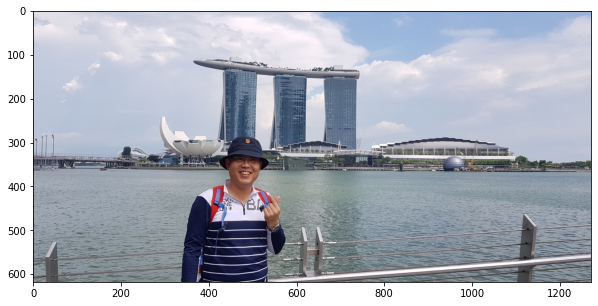

2. background image


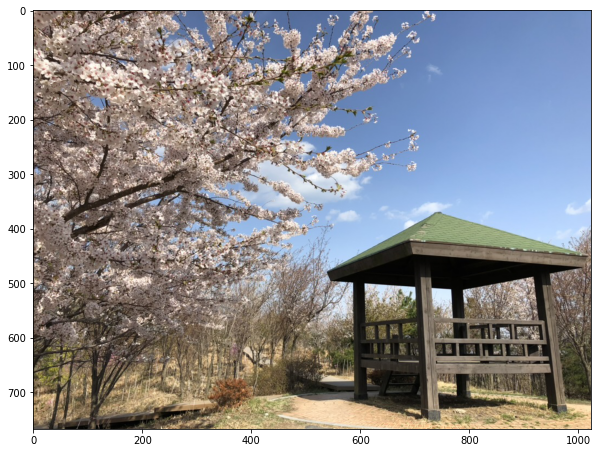

In [47]:
# 본인이 선택한 이미지의 경로에 맞게 바꿔 주세요.
f_img_path = 'C:/Users/dongu/aiffel/human_segmentation/images/psd21.png'  
b_img_path = 'C:/Users/dongu/aiffel/human_segmentation/images/back1.png' 
f_img_orig = cv2.imread(f_img_path) 
b_img_orig = cv2.imread(b_img_path) 

print("foreground image shape :", f_img_orig.shape)
print("background image shape :", b_img_orig.shape, '\n')

print("1. foreground image")
plt.figure(figsize=(10, 10))
plt.imshow(cv2.cvtColor(f_img_orig, cv2.COLOR_BGR2RGB))
plt.show()
print("2. background image")
plt.figure(figsize=(10, 10))
plt.imshow(cv2.cvtColor(b_img_orig, cv2.COLOR_BGR2RGB))
plt.show()

In [48]:
import pixellib
from pixellib.tune_bg import alter_bg

In [49]:
# 저장할 파일 이름을 결정합니다
model_dir = 'C:/Users/dongu/aiffel/human_segmentation/models/'
model_file = os.path.join(model_dir, 'xception_pascalvoc.pb')

In [50]:
f_img_path = 'C:/Users/dongu/aiffel/human_segmentation/images/psd21.png'  
b_img_path = 'C:/Users/dongu/aiffel/human_segmentation/images/back1.png'  
n_img_path = 'C:/Users/dongu/aiffel/human_segmentation/images/'

change_bg = alter_bg(model_type = "pb")
change_bg.load_pascalvoc_model(model_file)
change_bg.change_bg_img(f_img_path,
                        b_img_path,
                        output_image_name=n_img_path+"new_img1.png")

array([[[181, 189, 208],
        [160, 167, 188],
        [139, 148, 168],
        ...,
        [194, 145, 113],
        [194, 145, 113],
        [194, 145, 113]],

       [[225, 235, 253],
        [215, 224, 243],
        [197, 206, 225],
        ...,
        [194, 144, 113],
        [194, 145, 113],
        [194, 145, 113]],

       [[225, 235, 253],
        [223, 233, 252],
        [215, 225, 245],
        ...,
        [195, 145, 114],
        [195, 146, 114],
        [195, 146, 114]],

       ...,

       [[ 70,  83,  90],
        [ 70,  84,  91],
        [ 71,  84,  92],
        ...,
        [159, 206, 249],
        [159, 205, 249],
        [158, 205, 249]],

       [[ 77,  83,  90],
        [ 78,  83,  91],
        [ 78,  84,  92],
        ...,
        [161, 206, 248],
        [163, 208, 251],
        [160, 206, 250]],

       [[ 81,  83,  91],
        [ 80,  82,  90],
        [ 80,  83,  91],
        ...,
        [145, 191, 233],
        [157, 202, 245],
        [164, 209, 252]]

(618, 1272, 3)


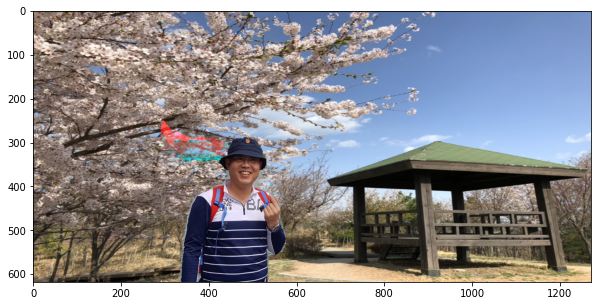

In [51]:
# 본인이 선택한 이미지의 경로에 맞게 바꿔 주세요.
nl_img_path = 'C:/Users/dongu/aiffel/human_segmentation/images/new_img1.png'  
n_img_orig = cv2.imread(nl_img_path) 

print(n_img_orig.shape)
plt.figure(figsize=(10, 10))
plt.imshow(cv2.cvtColor(n_img_orig, cv2.COLOR_BGR2RGB))
plt.show()

- foreground 로 지정한 이미지의 인물과 background 로 지정한 이미지의 배경이 합성되는 방법니다.
- background 로 지정한 이미지가  foreground로 지정한 이미지의 사이즈로 RESIZE 되면서 합성되는 것을 볼 수 있다.
- 또한 인물의 머리 쪽에 원본에 없는 이미지가 생성된 것도 같이 확인되는데 역시 완벽하지는 않을 것을 볼 수 있다.


### 4. 기타 다양한 사진을 시도해보자.

1. 강민경 사진

(2880, 5120, 3)


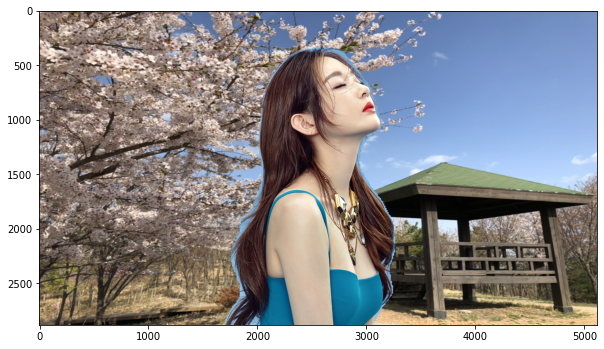

In [52]:
f_img_path = 'C:/Users/dongu/aiffel/human_segmentation/images/kangminkyung.png'  
b_img_path = 'C:/Users/dongu/aiffel/human_segmentation/images/back1.png'  
n_img_path = 'C:/Users/dongu/aiffel/human_segmentation/images/'

change_bg = alter_bg(model_type = "pb")
change_bg.load_pascalvoc_model(model_file)
change_bg.change_bg_img(f_img_path,
                        b_img_path,
                        output_image_name=n_img_path+"new_img2.png")

# 본인이 선택한 이미지의 경로에 맞게 바꿔 주세요.
nl_img_path = 'C:/Users/dongu/aiffel/human_segmentation/images/new_img2.png'  
n_img_orig = cv2.imread(nl_img_path) 

print(n_img_orig.shape)
plt.figure(figsize=(10, 10))
plt.imshow(cv2.cvtColor(n_img_orig, cv2.COLOR_BGR2RGB))
plt.show()

2. 김연아 사진

(2880, 5120, 3)


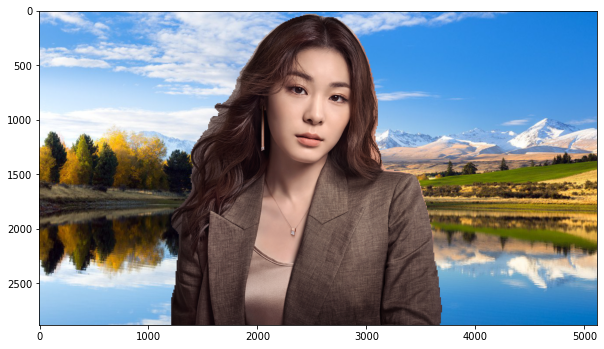

In [53]:
f_img_path = 'C:/Users/dongu/aiffel/human_segmentation/images/kimyuna.png'  
b_img_path = 'C:/Users/dongu/aiffel/human_segmentation/images/back2.png'  
n_img_path = 'C:/Users/dongu/aiffel/human_segmentation/images/'

change_bg = alter_bg(model_type = "pb")
change_bg.load_pascalvoc_model(model_file)
change_bg.change_bg_img(f_img_path,
                        b_img_path,
                        output_image_name=n_img_path+"new_img3.png")

# 본인이 선택한 이미지의 경로에 맞게 바꿔 주세요.
nl_img_path = 'C:/Users/dongu/aiffel/human_segmentation/images/new_img3.png'  
n_img_orig = cv2.imread(nl_img_path) 

print(n_img_orig.shape)
plt.figure(figsize=(10, 10))
plt.imshow(cv2.cvtColor(n_img_orig, cv2.COLOR_BGR2RGB))
plt.show()

3. 내 사진

(768, 1024, 3)


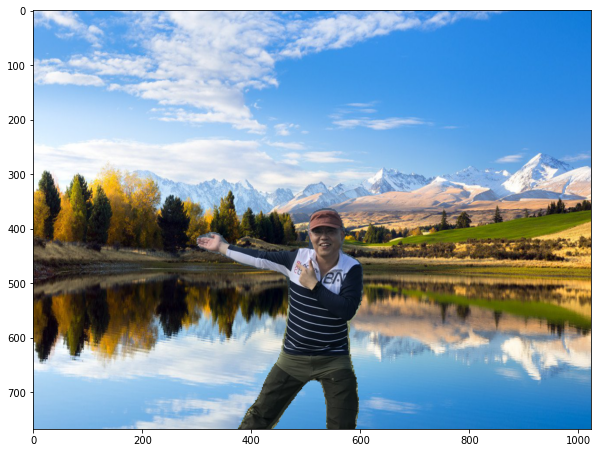

In [54]:
f_img_path = 'C:/Users/dongu/aiffel/human_segmentation/images/psd15.png'  
b_img_path = 'C:/Users/dongu/aiffel/human_segmentation/images/back2.png'  
n_img_path = 'C:/Users/dongu/aiffel/human_segmentation/images/'

change_bg = alter_bg(model_type = "pb")
change_bg.load_pascalvoc_model(model_file)
change_bg.change_bg_img(f_img_path,
                        b_img_path,
                        output_image_name=n_img_path+"new_img4.png")

# 본인이 선택한 이미지의 경로에 맞게 바꿔 주세요.
nl_img_path = 'C:/Users/dongu/aiffel/human_segmentation/images/new_img4.png'  
n_img_orig = cv2.imread(nl_img_path) 

print(n_img_orig.shape)
plt.figure(figsize=(10, 10))
plt.imshow(cv2.cvtColor(n_img_orig, cv2.COLOR_BGR2RGB))
plt.show()

## 회고

- 아웃포커싱 효과를 적용해 보기 위해 다양한 이미지를 시도해 보았다.
- 성공적으로 나오긴 했으나 일부분은 `blur`처리가 같이 되고 또 다른 이미지는 일부가 소실되기도 하는 현상들을 볼 수 있었다.
- 배경전환 크로마키도 시도해 보았고 다양한 방법들을 시도해 보고 노력을 했던 것 같다. 부족한 부분들도 다소 보였다. 
- 이를 해결하기 위해 pixellib 에서 제공하는 다양한 모델을 사용해 보았지만 깔끔하게 처리되는 결과는 보기 힘들었던 것 같다.
- 다만 사진의 상태에 따라서 구분하기 용이한 구조일 경우에는 괜찮은 이미지도 나오는 것 같았다.
- 위 과정을 거치는 동안 Semantic Segmentation 과 Instance Segmentation 의 차이점에 대해서 명확하게 학습하게 되었다.  
<BR>

- 추가적인 DEPTH 정보를 활용한 Semantic Segmentation mask의 오류를 보완할 수 있는 솔루션을 찾아보았다.
- 최첨단 탐지 및 세분화 알고리즘을 제공하는 Facebook AI Research의 차세대 라이브러리인 [DETECTRON2](https://github.com/facebookresearch/detectron2) 를 사용해 보려고 시도하였다.
- 설치지침으로는 리눅스와 맥(인텔버젼)에서 가능한 것으로 나오지만 윈도우에서도 가능하도록 [GITHUB](https://github.com/philferriere/cocoapi)에 공유되어 있는 내용들을 찾아서
- [PYTORCH](https://chancoding.tistory.com/90) 가상환경 설정 및 필요한 패키지들을 설치해 보았지만 결국엔 실패하고 말았다. 
- `THIRD PARTY` 패키지들이 다양했고 `visual studio` 로 컴파일을 해야해서 설치하고 시도해 보았지만 `cocotools` 라는 THIRD PARTY가
- 컴파일 과정에 에러가 나서 설치가 안되었다. 안타깝게도 다음에 다시 시도해 보려고 한다.  
<BR>

- DEPTH 정보를 활요한 오류를 보완할 다른 방법들도 LMS 노드에 링크 걸어둔 내용들을 살펴 보았지만 너무 방대하고 이해하기 쉽지 않았다. 
- 좀 더 자세한 내용들은 LMS 를 진행하면서 하나씩 알아갈 수 있는 날이 올거라고 생각하며 마무리 하려한다.
